## Medical Data Imaging Analysis:

- In-house data sample.

In [4]:
from pathlib import Path
import random
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.v2 as T
import torchvision.transforms.v2.functional as F
import onnxruntime as ort

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

# Enable inline plotting in Jupyter
%matplotlib inline
%cd ../

/home/kirtan-ghelani-sculptsoft/sculptsoft/projects/HEALTH-AIML/SeekIQ/RnD/rt-detr/github/RT-DETR-Polyp-Detection


In [5]:
ROOT_DIR = Path("client_data/positive_samples/")

# Assuming images are in a parallel "images" directory for each polyp type
# If not, adjust "images_dir" accordingly based on your actual structure
CONFIG = {
    "adenoma": {
        "images_dir": ROOT_DIR / "adenoma" / "images",
        "masks_dir": ROOT_DIR / "adenoma" / "masks",
        "target_color": [255, 0, 0],
    },
    "hyperplastic": {
        "images_dir": ROOT_DIR / "hyperplastic" / "images",
        "masks_dir": ROOT_DIR / "hyperplastic" / "masks",
        "target_color": [0, 255, 0],
    },
    # "benign": {
    #     "images_dir": ROOT_DIR / "benign" / "images",
    #     "masks_dir": ROOT_DIR / "benign" / "masks",
    #     "target_color": [157, 0, 255],
    # },
    # "no pathology": {
    #     "images_dir": ROOT_DIR / "no pathology" / "images",
    #     "masks_dir": ROOT_DIR / "no pathology" / "masks",
    #     "target_color": [255, 255, 255],
    # },
}

# List all polyp types
POLYP_TYPES = list(CONFIG.keys())

Loaded sample: 6.16.25.0930_frame_038622.png


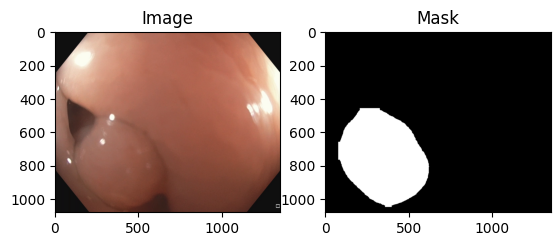

In [6]:
def load_random_sample(polyp_type):
    """Load a random image and its corresponding mask for a given polyp type."""
    config = CONFIG[polyp_type]
    
    # List image files (assuming .jpg or .png; adjust extensions if needed)
    image_files = list(config["images_dir"].glob("*.jpg")) + list(config["images_dir"].glob("*.png"))
    if not image_files:
        raise ValueError(f"No images found in {config['images_dir']}")
    
    # Select random image
    image_path = random.choice(image_files)
    
    # Assume mask has the same stem name (e.g., image.jpg -> mask.png); adjust if different
    mask_stem = image_path.stem
    mask_files = list(config["masks_dir"].glob(f"{mask_stem}.*"))
    if not mask_files:
        raise ValueError(f"No mask found for {image_path} in {config['masks_dir']}")
    mask_path = mask_files[0]
    
    # Load image and mask
    image = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path).convert("RGB")  # Assuming mask is RGB with target color
    
    return image, mask, image_path.name

# Example: Load one for testing
sample_image, sample_mask, sample_name = load_random_sample("adenoma")
print(f"Loaded sample: {sample_name}")
plt.subplot(1, 2, 1); plt.imshow(sample_image); plt.title("Image")
plt.subplot(1, 2, 2); plt.imshow(sample_mask); plt.title("Mask")
plt.show()

In [7]:
# Use torchvision transforms where possible, and custom for others like NBI and CLAHE

# Random Photometric Distortion (lighting/contrast variations)
photometric_distort = T.RandomPhotometricDistort(p=1.0)  # Always apply for testing

# CLAHE (Contrast Limited Adaptive Histogram Equalization) - using OpenCV
def apply_clahe(image):
    """Apply CLAHE to enhance local contrast."""
    image_np = np.array(image)
    image_lab = cv2.cvtColor(image_np, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    image_lab[:, :, 0] = clahe.apply(image_lab[:, :, 0])
    enhanced = cv2.cvtColor(image_lab, cv2.COLOR_LAB2RGB)
    return Image.fromarray(enhanced)

# NBI Simulation (enhance blue/green channels)
def apply_nbi(image, blue_factor=1.5, green_factor=1.2):
    """Simulate Narrow Band Imaging by boosting blue/green and reducing red."""
    image_np = np.array(image).astype(np.float32)
    image_np[:, :, 2] *= blue_factor  # Blue channel
    image_np[:, :, 1] *= green_factor  # Green channel
    image_np[:, :, 0] *= 0.8  # Reduce red slightly
    image_np = np.clip(image_np, 0, 255).astype(np.uint8)
    return Image.fromarray(image_np)

# Histogram Equalization (global)
histogram_eq = T.RandomEqualize(p=1.0)

# Brightness/Contrast Adjustment
brightness_contrast = T.ColorJitter(brightness=0.3, contrast=0.3)

# List of techniques to apply
TECHNIQUES = {
    "Photometric Distort": photometric_distort,
    "CLAHE": apply_clahe,
    "NBI Simulation": apply_nbi,
    "Histogram Equalization": histogram_eq,
    "Brightness/Contrast Jitter": brightness_contrast,
}


Visualizing techniques for ADENOMA


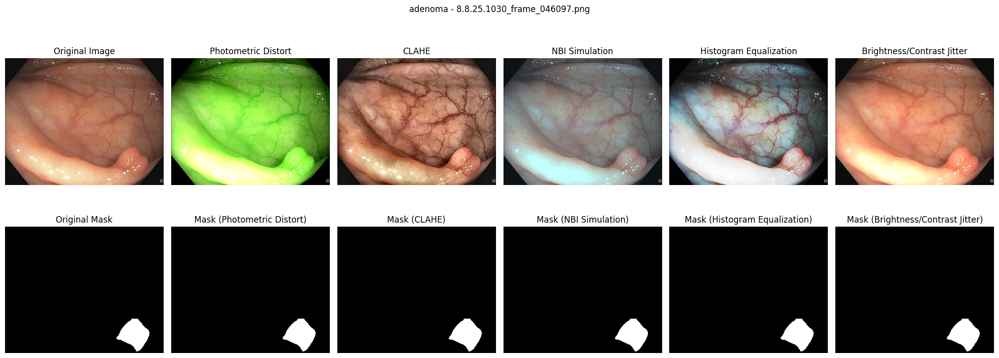


Visualizing techniques for HYPERPLASTIC


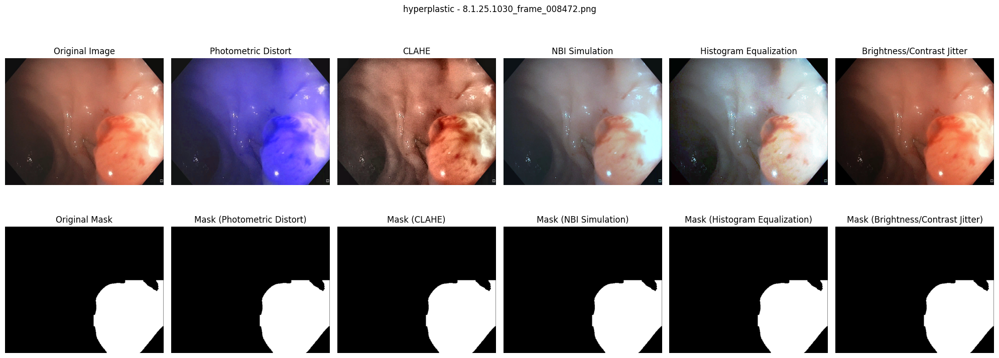

In [8]:
for polyp_type in POLYP_TYPES:
    print(f"\nVisualizing techniques for {polyp_type.upper()}")
    image, mask, image_name = load_random_sample(polyp_type)
    
    # Display original
    fig, axs = plt.subplots(2, len(TECHNIQUES) + 1, figsize=(20, 8))
    axs[0, 0].imshow(image)
    axs[0, 0].set_title("Original Image")
    axs[0, 0].axis("off")
    axs[1, 0].imshow(mask)
    axs[1, 0].set_title("Original Mask")
    axs[1, 0].axis("off")
    
    # Apply each technique and visualize
    for idx, (name, transform) in enumerate(TECHNIQUES.items(), 1):
        if callable(transform):  # For custom functions like CLAHE/NBI
            transformed_image = transform(image)
        else:  # For torchvision transforms
            transformed_image = transform(image)
        
        axs[0, idx].imshow(transformed_image)
        axs[0, idx].set_title(name)
        axs[0, idx].axis("off")
        
        # Mask remains the same (transformations are on image only)
        axs[1, idx].imshow(mask)
        axs[1, idx].set_title(f"Mask ({name})")
        axs[1, idx].axis("off")
    
    plt.suptitle(f"{polyp_type} - {image_name}")
    plt.tight_layout()
    plt.show()

In [43]:
# Assume your ONNX model path; replace with actual path
# ONNX_MODEL_PATH = "./output/rtdetr_r18vd_6x_classification_v1_2_1/polyp_classifier.onnx"  # Update this
ONNX_MODEL_PATH = "./output/rtdetr_ops_classification/polyp_classifier.onnx"  # Update this

# Load ONNX model with onnxruntime
ort_session = ort.InferenceSession(ONNX_MODEL_PATH)

# Print input details for reference (e.g., to confirm shape)
input_name = ort_session.get_inputs()[0].name
print("Model input name:", input_name)
print("Expected input shape:", ort_session.get_inputs()[0].shape)  # Likely [1, 3, 640, 640]

Model input name: images
Expected input shape: [1, 3, 640, 640]


In [44]:
def get_bbox_from_mask(mask, target_color):
    """Extract bounding box from mask using contour detection. Assumes mask is RGB with target_color."""
    mask_np = np.array(mask)
    # Create binary mask where target_color matches
    binary_mask = np.all(mask_np == target_color, axis=-1).astype(np.uint8) * 255
    
    # Find contours
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None  # No polyp found
    
    # Get the largest contour's bounding box (x, y, w, h)
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    return [x, y, x + w, y + h]  # xyxy format

# Example test
sample_bbox = get_bbox_from_mask(sample_mask, CONFIG["adenoma"]["target_color"])
print("Sample BBox:", sample_bbox)

Sample BBox: None


In [45]:
def run_inference(image, ort_session, input_size=(640, 640)):
    """Preprocess image, run ONNX inference, and return predictions (boxes, scores, classes)."""
    # Get original size (before resize)
    orig_w, orig_h = image.size
    orig_size = np.array([[orig_w, orig_h]], dtype=np.int64)
    
    # Preprocess: Resize and convert to tensor (matching reference script: no normalization)
    transform = T.Compose([
        T.Resize(input_size),
        T.ToTensor(),  # Converts PIL to float32 tensor in [0, 1]
    ])
    input_tensor = transform(image).unsqueeze(0).numpy()  # Add batch dim, to numpy for ORT
    
    # Get model input names dynamically
    inputs = ort_session.get_inputs()
    input_names = [inp.name for inp in inputs]
    
    # Prepare feed dict (handles standard or fallback names)
    feed_dict = {}
    if len(inputs) == 2:
        # Assume first is image input, second is orig size
        feed_dict[input_names[0]] = input_tensor
        feed_dict[input_names[1]] = orig_size
    else:
        raise ValueError(f"Unexpected number of inputs: {len(inputs)}. Expected 2.")
    
    # Run inference
    outputs = ort_session.run(None, feed_dict)
    
    # Parse outputs (matching reference: labels [batch, num_dets], boxes [batch, num_dets, 4], scores [batch, num_dets])
    labels = outputs[0][0]  # Class IDs (e.g., 0=adenoma, 1=hyperplastic)
    boxes = outputs[1][0]   # Boxes in xyxy (absolute coords, scaled to orig size)
    scores = outputs[2][0]  # Confidence scores
    
    # Filter by confidence (e.g., >0.5; adjust as needed)
    mask = scores > 0.5
    return boxes[mask], scores[mask], labels[mask]


Comparing predictions for ADENOMA (Sample 1/15)


/home/kirtan-ghelani-sculptsoft/sculptsoft/projects/HEALTH-AIML/SeekIQ/RnD/rt-detr/github/RT-DETR-Polyp-Detection/.venv/lib/python3.11/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


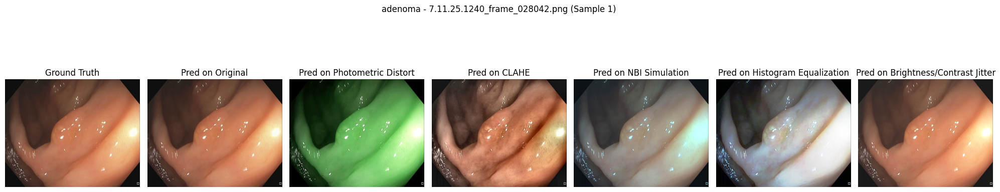


Comparing predictions for ADENOMA (Sample 2/15)


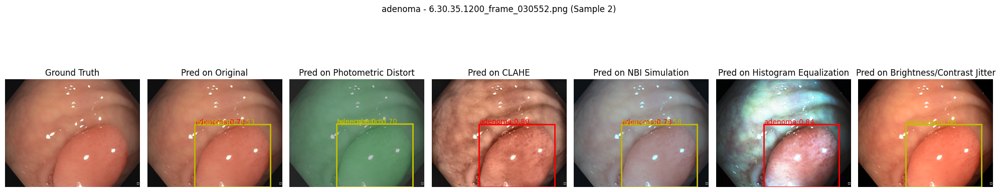


Comparing predictions for ADENOMA (Sample 3/15)


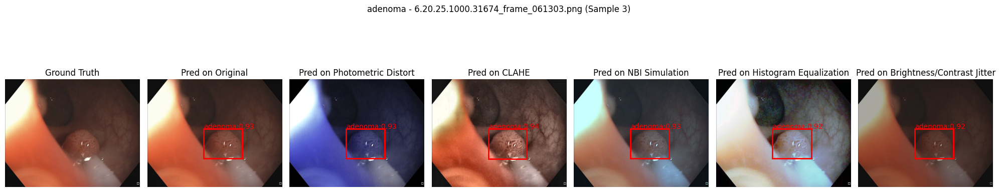


Comparing predictions for ADENOMA (Sample 4/15)


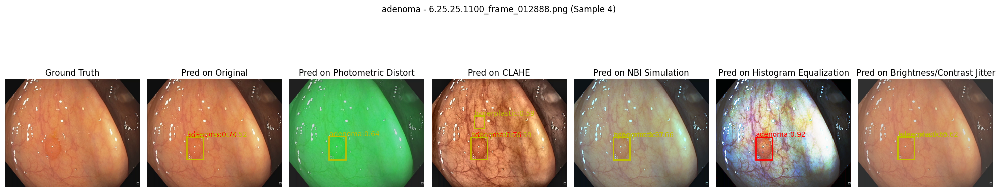


Comparing predictions for ADENOMA (Sample 5/15)


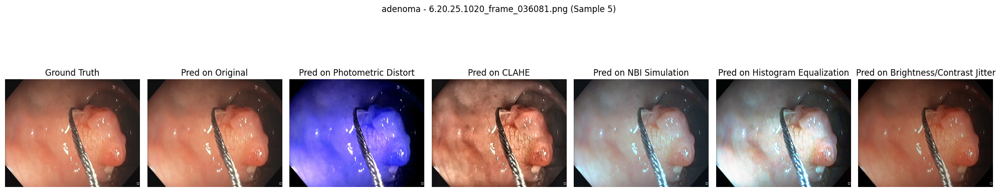


Comparing predictions for ADENOMA (Sample 6/15)


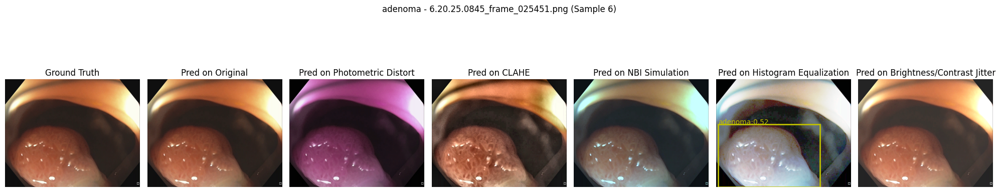


Comparing predictions for ADENOMA (Sample 7/15)


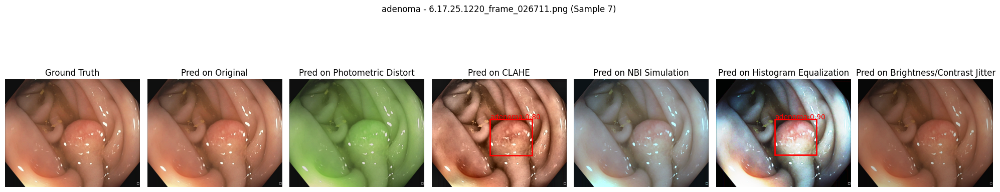


Comparing predictions for ADENOMA (Sample 8/15)


In [ ]:
# Number of samples/comparisons per polyp type (set N here; e.g., 5 for at least 5 comparisons)
N = 15  # Adjust this as needed for "at least N" predictions comparisons per type

for polyp_type in POLYP_TYPES:
    for sample_idx in range(N):
        print(f"\nComparing predictions for {polyp_type.upper()} (Sample {sample_idx + 1}/{N})")
        image, mask, image_name = load_random_sample(polyp_type)
        
        # Get ground truth bbox from mask
        gt_bbox = get_bbox_from_mask(mask, CONFIG[polyp_type]["target_color"])
        
        # List images to infer: original + transformed
        images_to_compare = {"Original": image}
        for name, transform in TECHNIQUES.items():
            if callable(transform):
                transformed = transform(image)
            else:
                transformed = transform(image)
            images_to_compare[name] = transformed
        
        # Visualize
        fig, axs = plt.subplots(1, len(images_to_compare) + 1, figsize=(20, 5))
        
        # GT with bbox
        axs[0].imshow(image)
        if gt_bbox:
            rect = plt.Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2] - gt_bbox[0], gt_bbox[3] - gt_bbox[1],
                                 edgecolor='g', facecolor='none', linewidth=2)
            axs[0].add_patch(rect)
        axs[0].set_title("Ground Truth")
        axs[0].axis("off")
        
        # Predictions on each
        for idx, (name, img) in enumerate(images_to_compare.items(), 1):
            boxes, scores, labels = run_inference(img, ort_session)
            
            axs[idx].imshow(img)
            for box, score, label in zip(boxes, scores, labels):
                # Draw box (assume label mapping: e.g., 0=adenoma, etc.; adjust as needed)
                color = 'r' if score > 0.7 else 'y'  # Red for high conf, yellow for medium
                rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                     edgecolor=color, facecolor='none', linewidth=2)
                axs[idx].add_patch(rect)
                # Map label to name if possible (update CLASS_NAMES if needed)
                label_name = ["adenoma", "hyperplastic"][int(label)] if int(label) < 2 else str(label)
                axs[idx].text(box[0], box[1] - 5, f"{label_name}:{score:.2f}", color=color)
            
            axs[idx].set_title(f"Pred on {name}")
            axs[idx].axis("off")
        
        plt.suptitle(f"{polyp_type} - {image_name} (Sample {sample_idx + 1})")
        plt.tight_layout()
        plt.show()

In [10]:
# Assume test screenshots are in a dedicated directory; adjust if needed
TEST_SCREENSHOTS_DIR = Path("test_data_in_house")  # Or Path("path/to/your/screenshots")

# List all screenshot files (assuming .jpg or .png; adjust extensions if needed)
SCREENSHOT_FILES = list(TEST_SCREENSHOTS_DIR.glob("*.jpg")) + list(TEST_SCREENSHOTS_DIR.glob("*.png"))
if not SCREENSHOT_FILES:
    raise ValueError(f"No screenshots found in {TEST_SCREENSHOTS_DIR}")

Loaded screenshot: case_35759_2.png


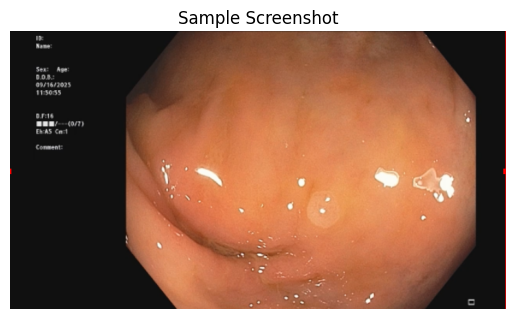

In [11]:
def load_random_screenshot():
    """Load a random screenshot image (no mask or GT)."""
    screenshot_path = random.choice(SCREENSHOT_FILES)
    image = Image.open(screenshot_path).convert("RGB")
    return image, screenshot_path.name

# Example: Load one for testing
sample_screenshot, sample_name = load_random_screenshot()
print(f"Loaded screenshot: {sample_name}")
plt.imshow(sample_screenshot)
plt.title("Sample Screenshot")
plt.axis("off")
plt.show()


Running inference on Screenshot (Sample 1/5)


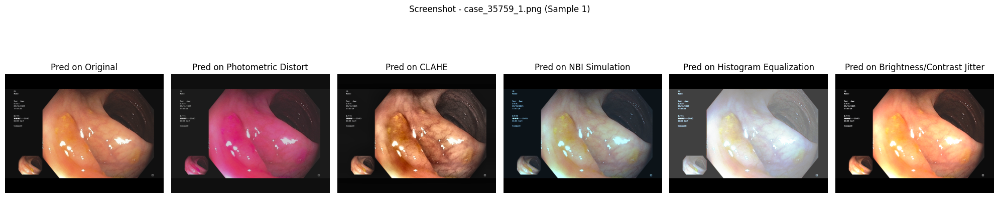


Running inference on Screenshot (Sample 2/5)


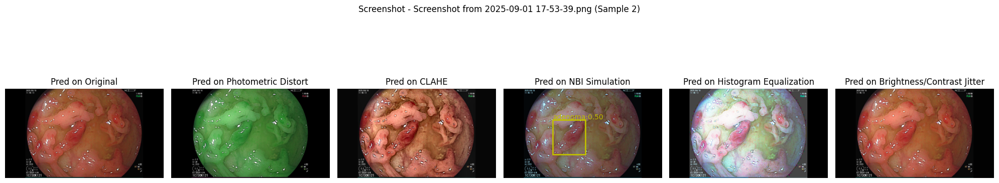


Running inference on Screenshot (Sample 3/5)


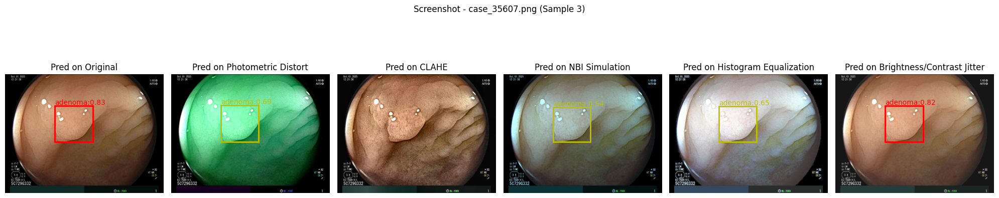


Running inference on Screenshot (Sample 4/5)


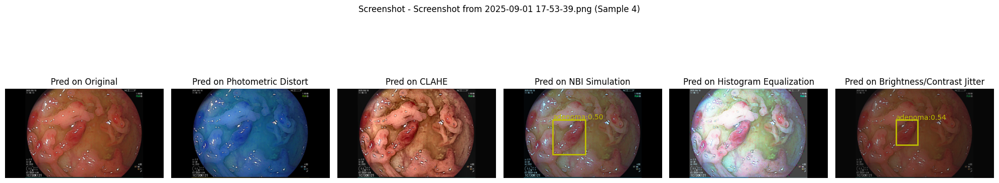


Running inference on Screenshot (Sample 5/5)


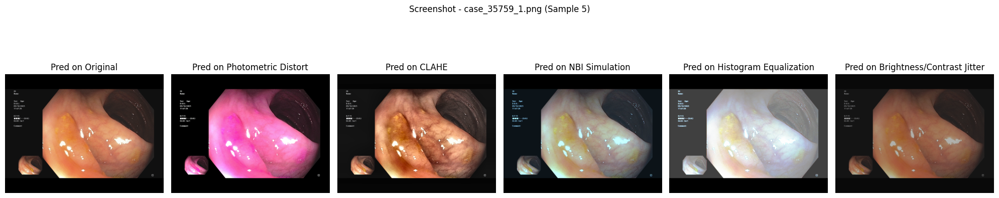

In [ ]:
# Number of screenshot samples to test (e.g., 5 for multiple comparisons)
M = 10  # Adjust this as needed for number of test inferences

for sample_idx in range(M):
    print(f"\nRunning inference on Screenshot (Sample {sample_idx + 1}/{M})")
    image, image_name = load_random_screenshot()
    
    # List images to infer: original + transformed (no GT, so start directly with preds)
    images_to_compare = {"Original": image}
    for name, transform in TECHNIQUES.items():
        if callable(transform):
            transformed = transform(image)
        else:
            transformed = transform(image)
        images_to_compare[name] = transformed
    
    # Visualize
    fig, axs = plt.subplots(1, len(images_to_compare), figsize=(20, 5))  # No extra GT column
    
    # Predictions on each
    for idx, (name, img) in enumerate(images_to_compare.items()):
        boxes, scores, labels = run_inference(img, ort_session)
        
        axs[idx].imshow(img)
        for box, score, label in zip(boxes, scores, labels):
            # Draw box (assume label mapping: e.g., 0=adenoma, etc.; adjust as needed)
            color = 'r' if score > 0.7 else 'y'  # Red for high conf, yellow for medium
            rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                 edgecolor=color, facecolor='none', linewidth=2)
            axs[idx].add_patch(rect)
            # Map label to name if possible (update CLASS_NAMES if needed)
            label_name = ["adenoma", "hyperplastic"][int(label)] if int(label) < 2 else str(label)
            axs[idx].text(box[0], box[1] - 5, f"{label_name}:{score:.2f}", color=color)
        
        axs[idx].set_title(f"Pred on {name}")
        axs[idx].axis("off")
    
    plt.suptitle(f"Screenshot - {image_name} (Sample {sample_idx + 1})")
    plt.tight_layout()
    plt.show()

---
### Sample Image Transformations Testing:

In [4]:
%load_ext autoreload
%autoreload 2

In [14]:
import sys
import os

# Add the parent directory to sys.path for relative imports
sys.path.append(os.path.abspath('..'))

# Optional: Verify the current working directory if needed
print(os.getcwd())



/home/kirtan-ghelani-sculptsoft/sculptsoft/projects/HEALTH-AIML/SeekIQ/RnD/rt-detr/github/RT-DETR-Polyp-Detection


In [15]:
# from src.data.transforms._transforms import CLAHEEnhance, RandomPhotometricDistort
from src.data.transforms._transforms import (
    CLAHEEnhance,
    NBISimulation,
    RandomEqualize,
    ColorJitter,
    RandomColorJitter
)

In [16]:
# Load a sample image (using existing load_random_sample; adjust polyp_type if needed)
sample_image, _, _ = load_random_sample("hyperplastic") 
print("Setup complete. Sample image loaded.")

Setup complete. Sample image loaded.


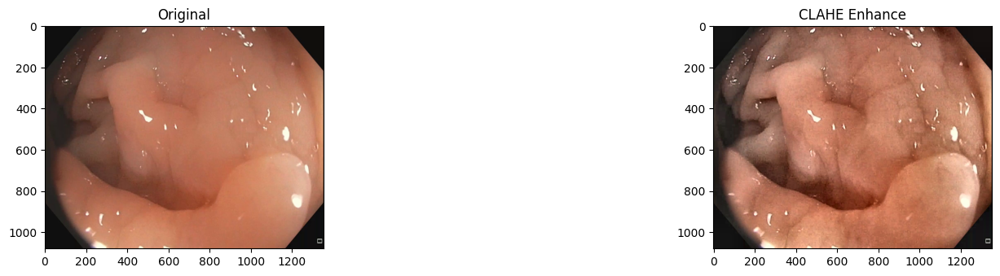

In [32]:
# Load a sample image (using existing load_random_sample; adjust polyp_type if needed)
# sample_image, _, _ = load_random_sample("hyperplastic")  # Or "hyperplastic"

# Import custom transforms (adjust path/file if integrated into RT-DETR code)

# Instantiate and apply
clahe_transform = CLAHEEnhance(clip_limit=3.0, p=1.0)
# clahe_transform = RandomPhotometricDistort(p=1.0)


clahe_image = clahe_transform(sample_image)

# Visualize
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1); plt.imshow(sample_image); plt.title("Original")
plt.subplot(1, 3, 3); plt.imshow(clahe_image); plt.title("CLAHE Enhance")
plt.show()

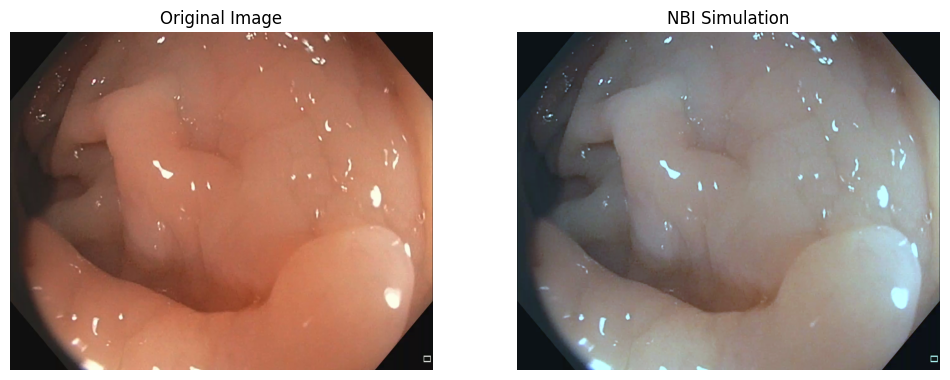

In [33]:
# Instantiate the NBI transform with probability 1.0 for testing
nbi_transform = NBISimulation(blue_factor=1.5, green_factor=1.2, red_factor=0.8, p=1.0)

# Apply the transform to the sample image
nbi_image = nbi_transform(sample_image)

# Visualize the original vs. the transformed image
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sample_image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(nbi_image)
plt.title("NBI Simulation")
plt.axis('off')

plt.show()

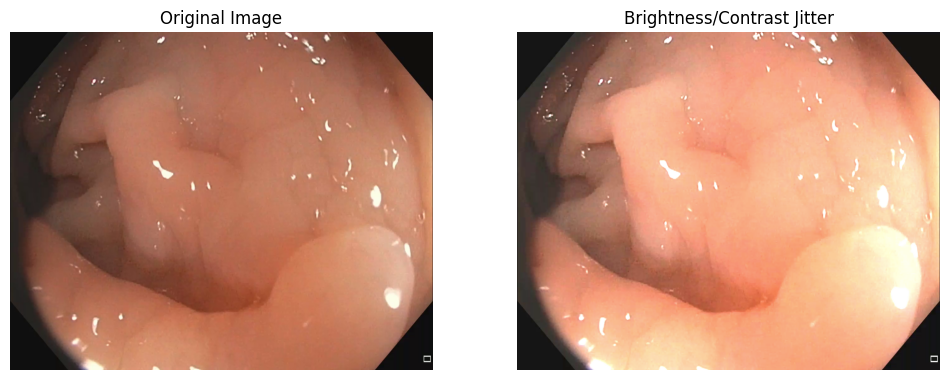

In [ ]:
# Instantiate the ColorJitter transform
# We use slightly higher values to make the effect more visible
# jitter_transform = ColorJitter(brightness=0.4, contrast=0.4, p=1.0)
# jitter = T.ColorJitter(brightness=0.4, contrast=0.8)
# Then, wrap it in RandomApply to control the probability
# jitter_transform = T.RandomApply([jitter], p=1.0) # Applies jitter 100% of the time for testing
jitter_transform = RandomColorJitter(p=1 , brightness=0.4, contrast=0.4, saturation=0.5, hue=0.5)
jitter_image = jitter_transform(sample_image)

# Apply the transform
jitter_image = jitter_transform(sample_image)

# Visualize the result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sample_image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(jitter_image)
plt.title("Brightness/Contrast Jitter")
plt.axis('off')

plt.show()

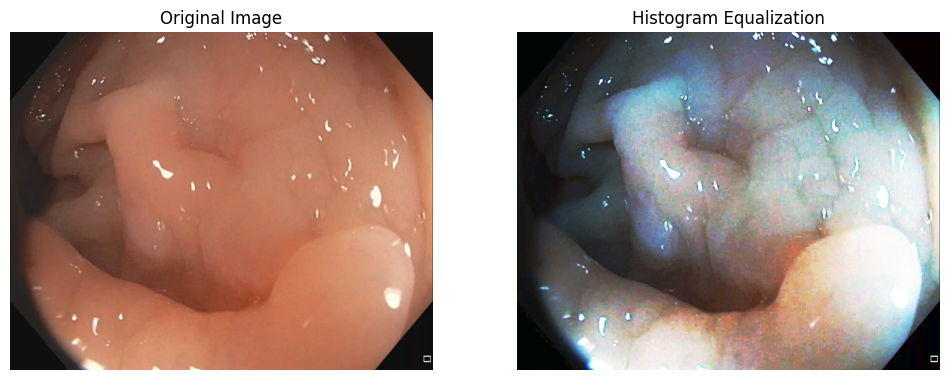

In [42]:
# Instantiate the RandomEqualize transform
equalize_transform = RandomEqualize(p=1.0)

# Apply the transform
equalized_image = equalize_transform(sample_image)

# Visualize the result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sample_image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image)
plt.title("Histogram Equalization")
plt.axis('off')

plt.show()